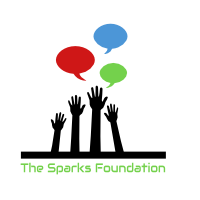

#                         The Spark Foundation #GRIPJUNE2021
#           TASK 5 - Exploratory Data Analysis - Sports

# By- Shruti Dhawle-(Data Science & Business Analytics)

## Exploratory Data Analysis - Sports

(Level - Advanced)

● Perform ‘Exploratory Data Analysis’ on dataset ‘Indian Premier League’
● As a sports analysts, find out the most successful teams, players and factors
contributing win or loss of a team.
● Suggest teams or players a company should endorse for its products.
● You can choose any of the tool of your choice

Dataset: https://bit.ly/34SRn3b

#  Problem Statement
#### "This is IPL's data containing 2 datasets - one gives details about the venues and players while the other captures ball-by-ball stats over 11 years of the league (2008-2018)". Here we try to get an overview of IPL in terms of teams, venues, umpires, toss decisions, winners and individual batsmen and bowlers.

Exploratory Data Analysis
Exploratory Data Analysis(EDA) is an approach to analyzing data sets to summarize their main characteristics, often with visual methods.

Here we will first start by analysing individual columns that is do univariate analysis and then move on to bivariate and multivariate analysis. In the course of this we will try to answer few questions that will tell us more about each venue, toss winner, individual players, umpires, etc.

# Importing Packages

In [2]:

# Importing Import Libraries

import os 
import csv
import pandas as pd
import numpy  as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')    
# Ignore warning related to pandas_profiling
sns.set(style='whitegrid')

# Loading data

In this EDA notebook we are using two datasets about Indian Premier League.

IPL matches dataset: This dataset contains information about the venues, players, umpires, toss decisions in 696 matches of IPL from 2008 - 2018.
IPL deliveries dataset: This dataset contains ball-by-ball information about 696 matches of IPL from 2008 - 2018.

# Importing first data

In [4]:
file_mat = r'E:\Internship SparkFoundation\matches.csv'
matches = pd.read_csv(file_mat)

In [5]:
matches.head()

,id,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2,umpire3
0,1,2017,Hyderabad,2017-04-05,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,Sunrisers Hyderabad,35,0,Yuvraj Singh,"Rajiv Gandhi International Stadium, Uppal",AY Dandekar,NJ Llong,NaN
1,2,2017,Pune,2017-04-06,Mumbai Indians,Rising Pune Supergiant,Rising Pune Supergiant,field,normal,0,Rising Pune Supergiant,0,7,SPD Smith,Maharashtra Cricket Association Stadium,A Nand Kishore,S Ravi,NaN
2,3,2017,Rajkot,2017-04-07,Gujarat Lions,Kolkata Knight Riders,Kolkata Knight Riders,field,normal,0,Kolkata Knight Riders,0,10,CA Lynn,Saurashtra Cricket Association Stadium,Nitin Menon,CK Nandan,NaN
3,4,2017,Indore,2017-04-08,Rising Pune Supergiant,Kings XI Punjab,Kings XI Punjab,field,normal,0,Kings XI Punjab,0,6,GJ Maxwell,Holkar Cricket Stadium,AK Chaudhary,C Shamshuddin,NaN
4,5,2017,Bangalore,2017-04-08,Royal Challengers Bangalore,Delhi Daredevils,Royal Challengers Bangalore,bat,normal,0,Royal Challengers Bangalore,15,0,KM Jadhav,M Chinnaswamy Stadium,NaN,NaN,NaN


In [6]:
matches.tail()

,id,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2,umpire3
751,11347,2019,Mumbai,05/05/19,Kolkata Knight Riders,Mumbai Indians,Mumbai Indians,field,normal,0,Mumbai Indians,0,9,HH Pandya,Wankhede Stadium,Nanda Kishore,O Nandan,S Ravi
752,11412,2019,Chennai,07/05/19,Chennai Super Kings,Mumbai Indians,Chennai Super Kings,bat,normal,0,Mumbai Indians,0,6,AS Yadav,M. A. Chidambaram Stadium,Nigel Llong,Nitin Menon,Ian Gould
753,11413,2019,Visakhapatnam,08/05/19,Sunrisers Hyderabad,Delhi Capitals,Delhi Capitals,field,normal,0,Delhi Capitals,0,2,RR Pant,ACA-VDCA Stadium,NaN,NaN,NaN
754,11414,2019,Visakhapatnam,10/05/19,Delhi Capitals,Chennai Super Kings,Chennai Super Kings,field,normal,0,Chennai Super Kings,0,6,F du Plessis,ACA-VDCA Stadium,Sundaram Ravi,Bruce Oxenford,Chettithody Shamshuddin
755,11415,2019,Hyderabad,12/05/19,Mumbai Indians,Chennai Super Kings,Mumbai Indians,bat,normal,0,Mumbai Indians,1,0,JJ Bumrah,Rajiv Gandhi Intl. Cricket Stadium,Nitin Menon,Ian Gould,Nigel Llong


In [7]:
matches.shape

(756, 18)

In [8]:
matches.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 756 entries, 0 to 755
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   id               756 non-null    int64 
 1   season           756 non-null    int64 
 2   city             749 non-null    object
 3   date             756 non-null    object
 4   team1            756 non-null    object
 5   team2            756 non-null    object
 6   toss_winner      756 non-null    object
 7   toss_decision    756 non-null    object
 8   result           756 non-null    object
 9   dl_applied       756 non-null    int64 
 10  winner           752 non-null    object
 11  win_by_runs      756 non-null    int64 
 12  win_by_wickets   756 non-null    int64 
 13  player_of_match  752 non-null    object
 14  venue            756 non-null    object
 15  umpire1          754 non-null    object
 16  umpire2          754 non-null    object
 17  umpire3          119 non-null    ob

In [9]:
matches.describe()

,id,season,dl_applied,win_by_runs,win_by_wickets
count,756.000000,756.000000,756.000000,756.000000,756.000000
mean,1792.178571,2013.444444,0.025132,13.283069,3.350529
std,3464.478148,3.366895,0.156630,23.471144,3.387963
min,1.000000,2008.000000,0.000000,0.000000,0.000000
25%,189.750000,2011.000000,0.000000,0.000000,0.000000
50%,378.500000,2013.000000,0.000000,0.000000,4.000000
75%,567.250000,2016.000000,0.000000,19.000000,6.000000
max,11415.000000,2019.000000,1.000000,146.000000,10.000000


In [16]:
matches.columns

Index(['id', 'season', 'city', 'date', 'team1', 'team2', 'toss_winner',
       'toss_decision', 'result', 'dl_applied', 'winner', 'win_by_runs',
       'win_by_wickets', 'player_of_match', 'venue', 'umpire1', 'umpire2',
       'umpire3'],
      dtype='object')

# Finding Null Values

In [10]:
matches.isnull().sum()

id                   0
season               0
city                 7
date                 0
team1                0
team2                0
toss_winner          0
toss_decision        0
result               0
dl_applied           0
winner               4
win_by_runs          0
win_by_wickets       0
player_of_match      4
venue                0
umpire1              2
umpire2              2
umpire3            637
dtype: int64

### From Pre profiling, we found that:
#### city has missing values
#### team1 and team2 columns have 14 distinct values but winner has 15 distinct values
#### umpire1 and umpire2 have 1 missing value each
#### umpire3 has 94% missing values
#### city has 33 distinct values while venue has 35 distinct values
#### Will take each of the above observations and work on them to make the data ready for EDA

# Filling in the missing values

In [12]:
#Filling in the missing values of city column
#First let's find the venues corresponding to which the values of city are empty

matches[matches.city.isnull()][['city','venue']]

,city,venue
461,NaN,Dubai International Cricket Stadium
462,NaN,Dubai International Cricket Stadium
466,NaN,Dubai International Cricket Stadium
468,NaN,Dubai International Cricket Stadium
469,NaN,Dubai International Cricket Stadium
474,NaN,Dubai International Cricket Stadium
476,NaN,Dubai International Cricket Stadium


In [20]:
#City values are empty for venue = Dubai International Cricket Stadium.
#So, missing values can be filled with Dubai

In [14]:
matches.city = matches.city.fillna('Dubai')

#### There are no more missing values in city column

In [15]:
#Player of match has 3 missing values. 
#Let's see this based on result column to find why it is empty

matches[matches.player_of_match.isnull()][['player_of_match','result']]

,player_of_match,result
300,NaN,no result
545,NaN,no result
570,NaN,no result
744,NaN,no result


#### This shows when there was no result(may be match was abandoned) then there was no player_of_match which makes sense

In [16]:
#umpire1 and umpire2 columns have one missing value each

matches[(matches.umpire1.isnull()) | (matches.umpire2.isnull())]

,id,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2,umpire3
4,5,2017,Bangalore,2017-04-08,Royal Challengers Bangalore,Delhi Daredevils,Royal Challengers Bangalore,bat,normal,0,Royal Challengers Bangalore,15,0,KM Jadhav,M Chinnaswamy Stadium,NaN,NaN,NaN
753,11413,2019,Visakhapatnam,08/05/19,Sunrisers Hyderabad,Delhi Capitals,Delhi Capitals,field,normal,0,Delhi Capitals,0,2,RR Pant,ACA-VDCA Stadium,NaN,NaN,NaN


#### So for the match between RCB and DD on 8th april 2017, umpire records were not captured

#### The column ‘umpire3’ has a significant number of NaN values. As the off-field umpire parameter is insignificant, we can drop this column.

In [19]:
#umpire3 column has close to 92% missing values. hence dropping that column

matches = matches.drop('umpire3', axis = 1)

In [20]:
#team 1 and team2 have 14 distinct values while winner has 15 distinct values. 
#Let's check the values of the winner column

matches.winner.value_counts()

Mumbai Indians                 109
Chennai Super Kings            100
Kolkata Knight Riders           92
Royal Challengers Bangalore     84
Kings XI Punjab                 82
Rajasthan Royals                75
Delhi Daredevils                67
Sunrisers Hyderabad             58
Deccan Chargers                 29
Gujarat Lions                   13
Pune Warriors                   12
Rising Pune Supergiant          10
Delhi Capitals                  10
Kochi Tuskers Kerala             6
Rising Pune Supergiants          5
Name: winner, dtype: int64

#### team1, team2 and winner all 3 columns have rising pune supergiant as well as rising pune supergiants. so we can just keep one of the names

In [22]:
matches['winner'] = matches['winner'].replace('Rising Pune Supergiant','Rising Pune Supergiants')
matches['team1'] = matches['team1'].replace('Rising Pune Supergiant','Rising Pune Supergiants')
matches['team2'] = matches['team2'].replace('Rising Pune Supergiant','Rising Pune Supergiants')

In [23]:
#So now team1, team2 and winner columns all have 13 distinct values

In [24]:
#city has 33 distinct values while we have 35 venues.
#Let's find out venues grouped by cities to see which cities have multiple venues

In [25]:
city_venue = matches.groupby(['city','venue']).count()['season']
city_venue_df = pd.DataFrame(city_venue)
city_venue_df

season
city           venue                                                     
Abu Dhabi      Sheikh Zayed Stadium                                     7
Ahmedabad      Sardar Patel Stadium, Motera                            12
Bangalore      M Chinnaswamy Stadium                                   66
Bengaluru      M Chinnaswamy Stadium                                    7
               M. Chinnaswamy Stadium                                   7
Bloemfontein   OUTsurance Oval                                          2
Cape Town      Newlands                                                 7
Centurion      SuperSport Park                                         12
Chandigarh     Punjab Cricket Association IS Bindra Stadium, M...      11
               Punjab Cricket Association Stadium, Mohali              35
Chennai        M. A. Chidambaram Stadium                                8
               MA Chidambaram Stadium, Chepauk                         49
Cuttack        Barabati Stadium                                         7
Delhi          Feroz Shah Kotla                                        67
               Feroz Shah Kotla Ground                                  7
Dharamsala     Himachal Pradesh Cricket Association Stadium             9
Dubai          Dubai International Cricket Stadium                      7
Durban         Kingsmead                                               15
East London    Buffalo Park                                             3
Hyderabad      Rajiv Gandhi International Stadium, Uppal               56
               Rajiv Gandhi Intl. Cricket Stadium                       8
Indore         Holkar Cricket Stadium                                   9
Jaipur         Sawai Mansingh Stadium                                  47
Johannesburg   New Wanderers Stadium                                    8
Kanpur         Green Park                                               4
Kimberley      De Beers Diamond Oval                                    3
Kochi          Nehru Stadium                                            5
Kolkata        Eden Gardens                                            77
Mohali         IS Bindra Stadium                                        7
               Punjab Cricket Association IS Bindra Stadium, M...       3
Mumbai         Brabourne Stadium                                       11
               Dr DY Patil Sports Academy                              17
               Wankhede Stadium                                        73
Nagpur         Vidarbha Cricket Association Stadium, Jamtha             3
Port Elizabeth St George's Park                                         7
Pune           Maharashtra Cricket Association Stadium                 21
               Subrata Roy Sahara Stadium                              17
Raipur         Shaheed Veer Narayan Singh International Stadium         6
Rajkot         Saurashtra Cricket Association Stadium                  10
Ranchi         JSCA International Stadium Complex                       7
Sharjah        Sharjah Cricket Stadium                                  6
Visakhapatnam  ACA-VDCA Stadium                                         2
               Dr. Y.S. Rajasekhara Reddy ACA-VDCA Cricket Sta...      11

## Observations

- Bengaluru and Bangalore both are in the data when they are same. So we need to keep one of them
- Chandigarh and Mohali are same and there is just one stadium Punjab Cricket Association IS Bindra Stadium, Mohali whose value has not been entered correctly. We need to have either Chandigarh or Mohali as well as correct name of the stadium there
- Mumbai has 3 stadiums/venues used for IPL
- Pune has 2 venues for IPL

In [27]:
matches['city'] = matches['city'].replace('Bangalore','Bengaluru')

In [28]:
matches['city'] = matches['city'].replace('Chandigarh','Mohali')
matches.venue = matches.venue.replace('Punjab Cricket Association Stadium, Mohali','Punjab Cricket Association IS Bindra Stadium, Mohali')

In [29]:
#checking number of cities and venues now

print(matches.city.nunique())
print(matches.venue.nunique())

31
40


# Importing Second Data

In [30]:
file_del = r'E:\Internship SparkFoundation\deliveries.csv'
deliveries = pd.read_csv(file_del)

In [31]:
deliveries.head()

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,is_super_over,...,bye_runs,legbye_runs,noball_runs,penalty_runs,batsman_runs,extra_runs,total_runs,player_dismissed,dismissal_kind,fielder
0,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,1,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,0,0,0,NaN,NaN,NaN
1,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,2,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,0,0,0,NaN,NaN,NaN
2,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,3,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,4,0,4,NaN,NaN,NaN
3,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,4,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,0,0,0,NaN,NaN,NaN
4,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,5,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,0,2,2,NaN,NaN,NaN


In [32]:
deliveries.tail()

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,is_super_over,...,bye_runs,legbye_runs,noball_runs,penalty_runs,batsman_runs,extra_runs,total_runs,player_dismissed,dismissal_kind,fielder
179073,11415,2,Chennai Super Kings,Mumbai Indians,20,2,RA Jadeja,SR Watson,SL Malinga,0,...,0,0,0,0,1,0,1,NaN,NaN,NaN
179074,11415,2,Chennai Super Kings,Mumbai Indians,20,3,SR Watson,RA Jadeja,SL Malinga,0,...,0,0,0,0,2,0,2,NaN,NaN,NaN
179075,11415,2,Chennai Super Kings,Mumbai Indians,20,4,SR Watson,RA Jadeja,SL Malinga,0,...,0,0,0,0,1,0,1,SR Watson,run out,KH Pandya
179076,11415,2,Chennai Super Kings,Mumbai Indians,20,5,SN Thakur,RA Jadeja,SL Malinga,0,...,0,0,0,0,2,0,2,NaN,NaN,NaN
179077,11415,2,Chennai Super Kings,Mumbai Indians,20,6,SN Thakur,RA Jadeja,SL Malinga,0,...,0,0,0,0,0,0,0,SN Thakur,lbw,NaN


In [33]:
deliveries.shape

(179078, 21)

In [34]:
deliveries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 179078 entries, 0 to 179077
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   match_id          179078 non-null  int64 
 1   inning            179078 non-null  int64 
 2   batting_team      179078 non-null  object
 3   bowling_team      179078 non-null  object
 4   over              179078 non-null  int64 
 5   ball              179078 non-null  int64 
 6   batsman           179078 non-null  object
 7   non_striker       179078 non-null  object
 8   bowler            179078 non-null  object
 9   is_super_over     179078 non-null  int64 
 10  wide_runs         179078 non-null  int64 
 11  bye_runs          179078 non-null  int64 
 12  legbye_runs       179078 non-null  int64 
 13  noball_runs       179078 non-null  int64 
 14  penalty_runs      179078 non-null  int64 
 15  batsman_runs      179078 non-null  int64 
 16  extra_runs        179078 non-null  int

In [35]:
deliveries.describe()

,match_id,inning,over,ball,is_super_over,wide_runs,bye_runs,legbye_runs,noball_runs,penalty_runs,batsman_runs,extra_runs,total_runs
count,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000
mean,1802.252957,1.482952,10.162488,3.615587,0.000452,0.036721,0.004936,0.021136,0.004183,0.000056,1.246864,0.067032,1.313897
std,3472.322805,0.502074,5.677684,1.806966,0.021263,0.251161,0.116480,0.194908,0.070492,0.016709,1.608270,0.342553,1.605422
min,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,190.000000,1.000000,5.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,379.000000,1.000000,10.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
75%,567.000000,2.000000,15.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
max,11415.000000,5.000000,20.000000,9.000000,1.000000,5.000000,4.000000,5.000000,5.000000,5.000000,7.000000,7.000000,10.000000


In [36]:
deliveries.columns

Index(['match_id', 'inning', 'batting_team', 'bowling_team', 'over', 'ball',
       'batsman', 'non_striker', 'bowler', 'is_super_over', 'wide_runs',
       'bye_runs', 'legbye_runs', 'noball_runs', 'penalty_runs',
       'batsman_runs', 'extra_runs', 'total_runs', 'player_dismissed',
       'dismissal_kind', 'fielder'],
      dtype='object')

# Checking For Null Values

In [37]:
deliveries.isnull().sum()

match_id                 0
inning                   0
batting_team             0
bowling_team             0
over                     0
ball                     0
batsman                  0
non_striker              0
bowler                   0
is_super_over            0
wide_runs                0
bye_runs                 0
legbye_runs              0
noball_runs              0
penalty_runs             0
batsman_runs             0
extra_runs               0
total_runs               0
player_dismissed    170244
dismissal_kind      170244
fielder             172630
dtype: int64

### Here we will perform Data Preprocessing on our deliveries dataset first, to make the data usable for EDA.

In [39]:
#In matches dataset, Rising Pune Supergiants had duplicate entries. Let's check if the same exists here as well

In [40]:
#We will check the batting_team and bowling_team values

print(deliveries.batting_team.unique())
print(deliveries.bowling_team.unique())

['Sunrisers Hyderabad' 'Royal Challengers Bangalore' 'Mumbai Indians'
 'Rising Pune Supergiant' 'Gujarat Lions' 'Kolkata Knight Riders'
 'Kings XI Punjab' 'Delhi Daredevils' 'Chennai Super Kings'
 'Rajasthan Royals' 'Deccan Chargers' 'Kochi Tuskers Kerala'
 'Pune Warriors' 'Rising Pune Supergiants' 'Delhi Capitals']
['Royal Challengers Bangalore' 'Sunrisers Hyderabad'
 'Rising Pune Supergiant' 'Mumbai Indians' 'Kolkata Knight Riders'
 'Gujarat Lions' 'Kings XI Punjab' 'Delhi Daredevils'
 'Chennai Super Kings' 'Rajasthan Royals' 'Deccan Chargers'
 'Kochi Tuskers Kerala' 'Pune Warriors' 'Rising Pune Supergiants'
 'Delhi Capitals']


In [41]:
#The same problem exists. Making it Rising Pune Supergiants

In [42]:
deliveries['batting_team'] = deliveries['batting_team'].replace('Rising Pune Supergiant','Rising Pune Supergiants')
deliveries['bowling_team'] = deliveries['bowling_team'].replace('Rising Pune Supergiant','Rising Pune Supergiants')

# Exploratory Data Analysis on:-

- Total number of teams participating (Team names and its size)
- Details on Toss won by each team, Total Matches played so far, Total matches being won
- Total number of matches won by each team (Bar plot Analysis)
- Maximum Toss Won by the teams (Bar Plot Analysis)
- Teams who had won Toss and Won the match
- Building teh result summary statistics

# Now, We will merge the 2 datasets for better insights from the data

In [44]:
#merging the 2 datasets
merge_df = pd.merge(deliveries,matches, left_on='match_id', right_on ='id')
merge_df.head()

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,is_super_over,...,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2
0,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,1,DA Warner,S Dhawan,TS Mills,0,...,field,normal,0,Sunrisers Hyderabad,35,0,Yuvraj Singh,"Rajiv Gandhi International Stadium, Uppal",AY Dandekar,NJ Llong
1,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,2,DA Warner,S Dhawan,TS Mills,0,...,field,normal,0,Sunrisers Hyderabad,35,0,Yuvraj Singh,"Rajiv Gandhi International Stadium, Uppal",AY Dandekar,NJ Llong
2,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,3,DA Warner,S Dhawan,TS Mills,0,...,field,normal,0,Sunrisers Hyderabad,35,0,Yuvraj Singh,"Rajiv Gandhi International Stadium, Uppal",AY Dandekar,NJ Llong
3,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,4,DA Warner,S Dhawan,TS Mills,0,...,field,normal,0,Sunrisers Hyderabad,35,0,Yuvraj Singh,"Rajiv Gandhi International Stadium, Uppal",AY Dandekar,NJ Llong
4,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,5,DA Warner,S Dhawan,TS Mills,0,...,field,normal,0,Sunrisers Hyderabad,35,0,Yuvraj Singh,"Rajiv Gandhi International Stadium, Uppal",AY Dandekar,NJ Llong


In [45]:
merge_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 179078 entries, 0 to 179077
Data columns (total 38 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   match_id          179078 non-null  int64 
 1   inning            179078 non-null  int64 
 2   batting_team      179078 non-null  object
 3   bowling_team      179078 non-null  object
 4   over              179078 non-null  int64 
 5   ball              179078 non-null  int64 
 6   batsman           179078 non-null  object
 7   non_striker       179078 non-null  object
 8   bowler            179078 non-null  object
 9   is_super_over     179078 non-null  int64 
 10  wide_runs         179078 non-null  int64 
 11  bye_runs          179078 non-null  int64 
 12  legbye_runs       179078 non-null  int64 
 13  noball_runs       179078 non-null  int64 
 14  penalty_runs      179078 non-null  int64 
 15  batsman_runs      179078 non-null  int64 
 16  extra_runs        179078 non-null  int

- info function gives us the following insights into the merge_df dataframe:

- There are a total of 164750 rows and 39 columns in the dataframe now.

- There are 18 columns with a numeric datatype and 21 columns with an object datatype.

- There are missing values in the player_dismissed, dismissal_kind, fielder, city, winner, player_of_match and all umpire columns.

In [47]:
matches.id.is_unique

True

In [48]:
#since id is unique we can set this as our index
matches.set_index('id', inplace=True)

In [49]:
#Summary statistics of matches data
matches.describe(include = 'all')

,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2
count,756.000000,756,756,756,756,756,756,756,756.000000,752,756.000000,756.000000,752,756,754,754
unique,NaN,31,546,14,14,15,2,3,NaN,14,NaN,NaN,226,40,61,65
top,NaN,Mumbai,2015-05-16,Mumbai Indians,Royal Challengers Bangalore,Mumbai Indians,field,normal,NaN,Mumbai Indians,NaN,NaN,CH Gayle,Eden Gardens,HDPK Dharmasena,S Ravi
freq,NaN,101,2,101,95,98,463,743,NaN,109,NaN,NaN,21,77,73,57
mean,2013.444444,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.025132,NaN,13.283069,3.350529,NaN,NaN,NaN,NaN
std,3.366895,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.156630,NaN,23.471144,3.387963,NaN,NaN,NaN,NaN
min,2008.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,NaN,NaN,NaN,NaN
25%,2011.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,NaN,NaN,NaN,NaN
50%,2013.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,4.000000,NaN,NaN,NaN,NaN
75%,2016.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,19.000000,6.000000,NaN,NaN,NaN,NaN


- describe function gives us the following insights into the matches dataframe:

- win_by_runs and win_by_wickets are the only numeric columns.

- win_by_runs is right skewed with outliers.

- Rest all columns are either already categorical or can be interpreted as categorical even if inputted as numeric

#  Pandas Profiling after Data Preprocessing
Here, we will perform Pandas Profiling after preprocessing our matches dataset

In [55]:
import pandas_profiling

In [52]:
post_profile = matches.profile_report(title="Matches Profile after Data Preprocessing")
post_profile.to_file(output_file="matches_profiling_after_preprocessing.html")

Summarize dataset:   0%|          | 0/30 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [53]:
post_profile

In [54]:
post_profile = deliveries.profile_report(title="Deliveries Profile after Data Preprocessing")
post_profile.to_file(output_file="deliveries_profiling_after_preprocessing.html")

Summarize dataset:   0%|          | 0/34 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [56]:
post_profile

# Exploratory Data Analysis:
# Number of matches played in each season

In [57]:
matches.season.value_counts()

2013    76
2012    74
2011    73
2010    60
2014    60
2016    60
2018    60
2019    60
2015    59
2017    59
2008    58
2009    57
Name: season, dtype: int64

(array([ 0., 10., 20., 30., 40., 50., 60., 70., 80.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

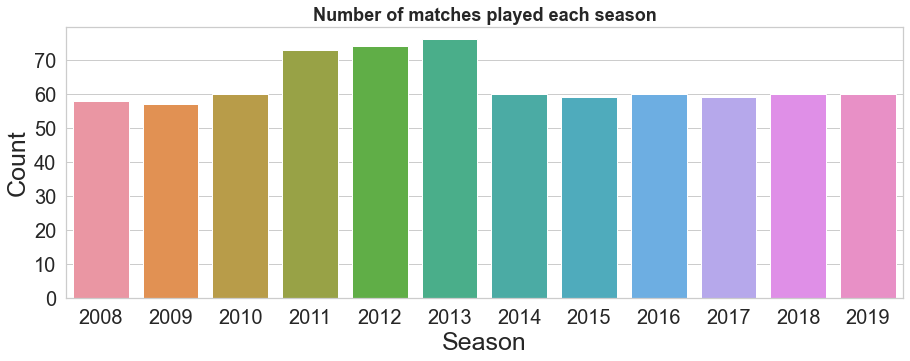

In [58]:
plt.figure(figsize=(15,5))
sns.countplot('season', data = matches)
plt.title("Number of matches played each season",fontsize=18,fontweight="bold")
plt.ylabel("Count", size = 25)
plt.xlabel("Season", size = 25)
plt.xticks(size = 20)
plt.yticks(size = 20)

2011-2013 have more matches being played than other seasons

All other seasons have approximately 58-60 matches while 2011-2013 have more than 70 matches

#### Let's find out the reason for this

# How many teams played in each season?

(array([ 0.,  2.,  4.,  6.,  8., 10., 12.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

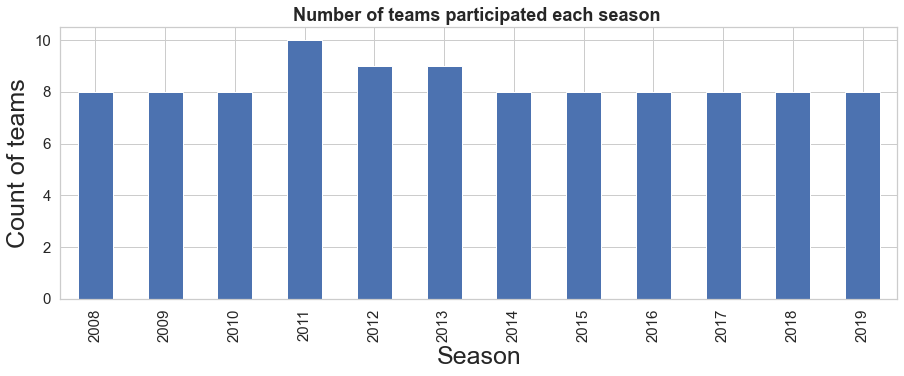

In [60]:
matches.groupby('season')['team1'].nunique().plot(kind = 'bar', figsize=(15,5))
plt.title("Number of teams participated each season ",fontsize=18,fontweight="bold")
plt.ylabel("Count of teams", size = 25)
plt.xlabel("Season", size = 25)
plt.xticks(size = 15)
plt.yticks(size = 15)

### 10 teams played in 2011 and 9 teams each in 2012 and 2013

### This explains why 2011-2013 have seen more matches being played than other seasons

# Which team has dominated or maximum wins  IPL so far?

In [61]:
#creating a dataframe with season and winner columns
winning_teams = matches[['season','winner']]

#dictionaries to get winners to each season
winners_team = {}
for i in sorted(winning_teams.season.unique()):
    winners_team[i] = winning_teams[winning_teams.season == i]['winner'].tail(1).values[0]
    
winners_of_IPL = pd.Series(winners_team)
winners_of_IPL = pd.DataFrame(winners_of_IPL, columns=['team'])

In [62]:
winners_of_IPL

,team
2008,Rajasthan Royals
2009,Deccan Chargers
2010,Chennai Super Kings
2011,Chennai Super Kings
2012,Kolkata Knight Riders
2013,Mumbai Indians
2014,Kolkata Knight Riders
2015,Mumbai Indians
2016,Sunrisers Hyderabad
2017,Mumbai Indians


(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Mumbai Indians'),
  Text(0, 1, 'Chennai Super Kings'),
  Text(0, 2, 'Kolkata Knight Riders'),
  Text(0, 3, 'Rajasthan Royals'),
  Text(0, 4, 'Sunrisers Hyderabad'),
  Text(0, 5, 'Deccan Chargers')])

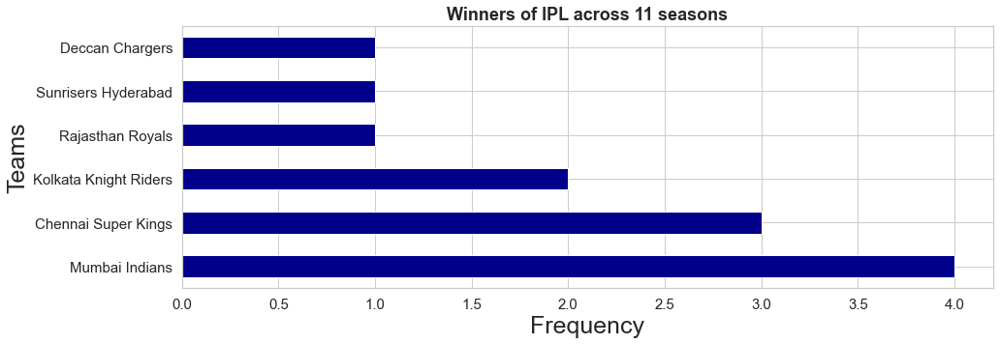

In [63]:
winners_of_IPL['team'].value_counts().plot(kind = 'barh', figsize = (15,5), color = 'darkblue')
plt.title("Winners of IPL across 11 seasons",fontsize=18,fontweight="bold")
plt.ylabel("Teams", size = 25)
plt.xlabel("Frequency", size = 25)
plt.xticks(size = 15)
plt.yticks(size = 15)

- MI have won 4 times and CSK have won 3 times each followed by KKR who has won 2 times.
- Hyderabad team has also won 2 matches under 2 franchise name - Deccan Chargers and Sunrisers Hyderabad

# Venue which has hosted most number of IPL matches?

In [64]:
matches.venue.value_counts().sort_values(ascending = False)

Eden Gardens                                            77
Wankhede Stadium                                        73
M Chinnaswamy Stadium                                   73
Feroz Shah Kotla                                        67
Rajiv Gandhi International Stadium, Uppal               56
MA Chidambaram Stadium, Chepauk                         49
Punjab Cricket Association IS Bindra Stadium, Mohali    49
Sawai Mansingh Stadium                                  47
Maharashtra Cricket Association Stadium                 21
Subrata Roy Sahara Stadium                              17
Dr DY Patil Sports Academy                              17
Kingsmead                                               15
Sardar Patel Stadium, Motera                            12
SuperSport Park                                         12
Brabourne Stadium                                       11
Dr. Y.S. Rajasekhara Reddy ACA-VDCA Cricket Stadium     11
Saurashtra Cricket Association Stadium                  

Text(0.5, 0, 'Frequency')

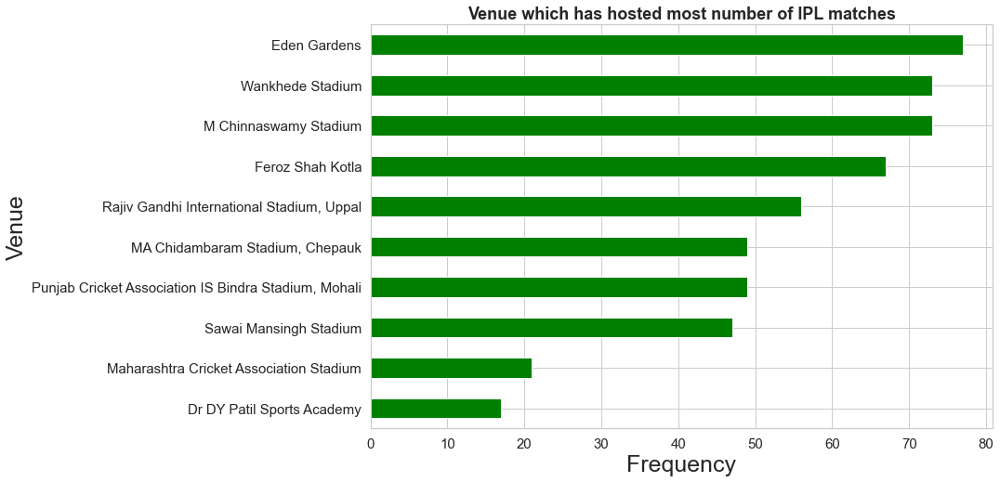

In [65]:
matches.venue.value_counts().sort_values(ascending = True).tail(10).plot(kind = 'barh',figsize=(12,8), 
                                                                         fontsize=15, color='green')
plt.title("Venue which has hosted most number of IPL matches",fontsize=18,fontweight="bold")
plt.ylabel("Venue", size = 25)
plt.xlabel("Frequency", size = 25)

- Eden Gardens in Kolkata  has hosted the highest number of matches so far in IPL followed by M Chinnaswamy Stadium in Bengaluru

# Does teams choosed to bat or field first, after winning toss?

In [66]:
matches.toss_decision.value_counts()/len(matches)*100

field    61.243386
bat      38.756614
Name: toss_decision, dtype: float64

Text(0.5, 1.0, 'Decision taken by captains after winning tosses')

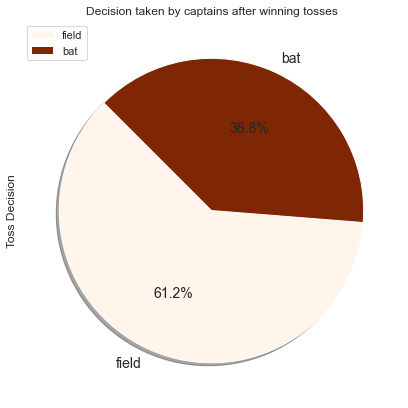

In [67]:
matches['toss_decision'].value_counts().plot(kind='pie', fontsize=14, autopct='%3.1f%%', 
                                               figsize=(10,7), shadow=True, startangle=135, legend=True, cmap='Oranges')

plt.ylabel('Toss Decision')
plt.title('Decision taken by captains after winning tosses')

- Close to 61% times teams who have won tosses have decided to field first

# Does winning toss help in winning matches?

In [68]:
#In order to answer this question #for this we create a new column with help of toss_winner and winner columns
#whenever the values are equal we will put yes in the new column and no otherwise

In [69]:
matches['toss_win_game_win'] = np.where((matches.toss_winner == matches.winner),'Yes','No')
matches.head()

,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2,toss_win_game_win
id,,,,,,,,,,,,,,,,,
1,2017,Hyderabad,2017-04-05,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,Sunrisers Hyderabad,35,0,Yuvraj Singh,"Rajiv Gandhi International Stadium, Uppal",AY Dandekar,NJ Llong,No
2,2017,Pune,2017-04-06,Mumbai Indians,Rising Pune Supergiants,Rising Pune Supergiant,field,normal,0,Rising Pune Supergiants,0,7,SPD Smith,Maharashtra Cricket Association Stadium,A Nand Kishore,S Ravi,No
3,2017,Rajkot,2017-04-07,Gujarat Lions,Kolkata Knight Riders,Kolkata Knight Riders,field,normal,0,Kolkata Knight Riders,0,10,CA Lynn,Saurashtra Cricket Association Stadium,Nitin Menon,CK Nandan,Yes
4,2017,Indore,2017-04-08,Rising Pune Supergiants,Kings XI Punjab,Kings XI Punjab,field,normal,0,Kings XI Punjab,0,6,GJ Maxwell,Holkar Cricket Stadium,AK Chaudhary,C Shamshuddin,Yes
5,2017,Bengaluru,2017-04-08,Royal Challengers Bangalore,Delhi Daredevils,Royal Challengers Bangalore,bat,normal,0,Royal Challengers Bangalore,15,0,KM Jadhav,M Chinnaswamy Stadium,NaN,NaN,Yes


(array([  0.,  50., 100., 150., 200., 250., 300., 350., 400., 450.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

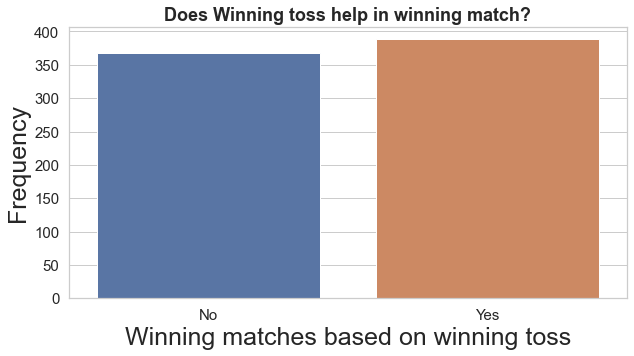

In [70]:
plt.figure(figsize=(10,5))
sns.countplot('toss_win_game_win', data=matches)
plt.title("Does Winning toss help in winning match?",fontsize=18,fontweight="bold")
plt.ylabel("Frequency", size = 25)
plt.xlabel("Winning matches based on winning toss", size = 25)
plt.xticks(size = 15)
plt.yticks(size = 15)

# How toss decision affects match results?

Text(0, 0.5, 'Frequency')

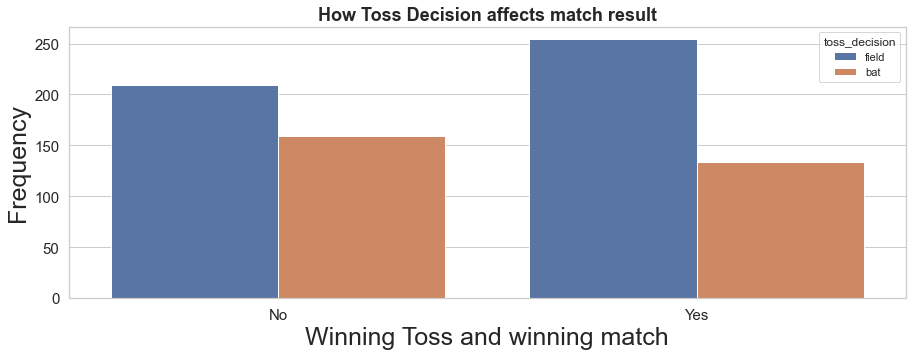

In [71]:
matches['toss_win_game_win'] = np.where((matches.toss_winner == matches.winner),'Yes','No')
plt.figure(figsize = (15,5))
sns.countplot('toss_win_game_win', data=matches, hue = 'toss_decision')
plt.title("How Toss Decision affects match result", fontsize=18,fontweight="bold")
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.xlabel("Winning Toss and winning match", fontsize = 25)
plt.ylabel("Frequency", fontsize = 25)

- Teams winning tosses and elect to field first have won most number of times.
- Teams winning tosses have won slightly more number of matches


In [80]:
pd.crosstab(matches.toss_win_game_win, matches.toss_decision)

toss_decision,bat,field
toss_win_game_win,,
No,159,209
Yes,134,254


# Which player's performance has mostly led to his team's win?

In [81]:
#MoM awards
MoM = pd.DataFrame(matches.player_of_match.value_counts())
MoM.head()

,player_of_match
CH Gayle,21
AB de Villiers,20
RG Sharma,17
DA Warner,17
MS Dhoni,17


Text(0.5, 0, 'Players')

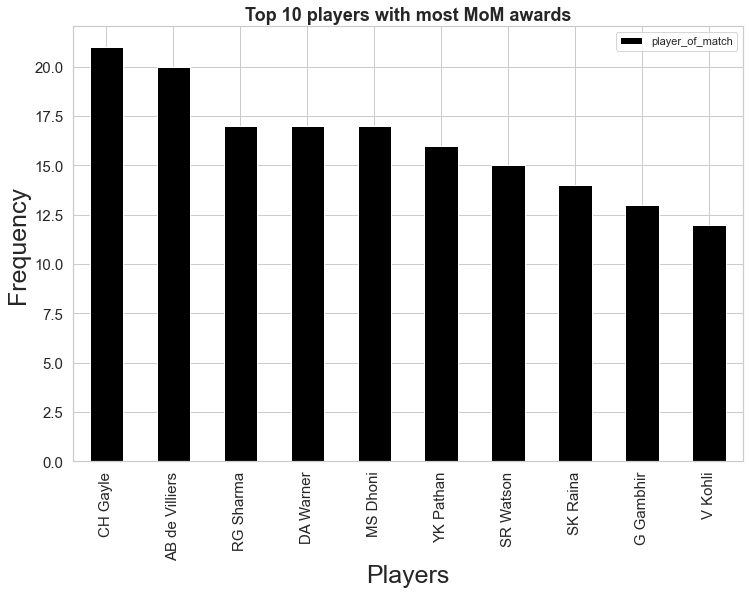

In [82]:
MoM.head(10).plot(kind = 'bar',figsize=(12,8), fontsize=15, color='black')
plt.title("Top 10 players with most MoM awards",fontsize=18,fontweight="bold")
plt.ylabel("Frequency", size = 25)
plt.xlabel("Players", size = 25)

- Chris Gayle has so far won the most number of MoM awards followed by AB de Villiers.
- Also, all top 10 are batsmen which kind of hints that in IPL batsmen have mostly dictated the matches

# Has Gayle won MoM awards consistently across all venues or does he have a skewed distribution towards any particular venue?

In [83]:
CH_Gayle = matches[matches['player_of_match']== 'CH Gayle'][['player_of_match','season','venue','city']]
CH_Gayle.groupby('venue')['player_of_match'].value_counts().sort_values(ascending = False)

venue                                                 player_of_match
M Chinnaswamy Stadium                                 CH Gayle           9
Punjab Cricket Association IS Bindra Stadium, Mohali  CH Gayle           3
Eden Gardens                                          CH Gayle           2
Feroz Shah Kotla                                      CH Gayle           1
Kingsmead                                             CH Gayle           1
MA Chidambaram Stadium, Chepauk                       CH Gayle           1
Saurashtra Cricket Association Stadium                CH Gayle           1
Sawai Mansingh Stadium                                CH Gayle           1
Subrata Roy Sahara Stadium                            CH Gayle           1
Wankhede Stadium                                      CH Gayle           1
Name: player_of_match, dtype: int64

(array([ 0.,  2.,  4.,  6.,  8., 10.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

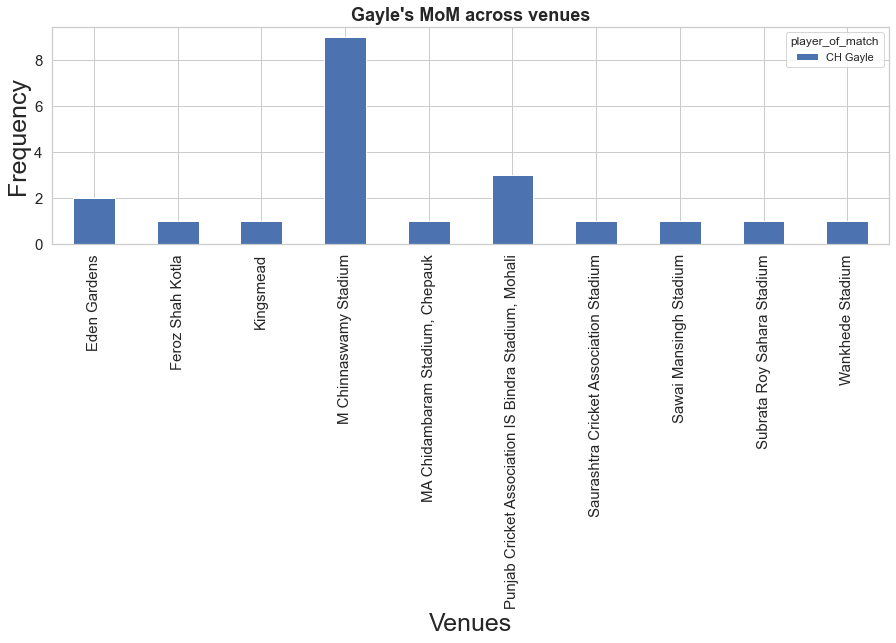

In [76]:
CH_Gayle.groupby('venue')['player_of_match'].value_counts().unstack().plot(kind = 'bar', stacked = False, 
                                                                          figsize =(15,4),fontsize =15)
plt.title("Gayle's MoM across venues",fontsize=18,fontweight="bold")
plt.ylabel("Frequency", size = 25)
plt.xlabel("Venues", size = 25)
plt.xticks(size = 15)
plt.yticks(size = 15)

- Gayle has won MoM most in Bengaluru. This is mainly because he played for this franschise for the longest timeperiod.

# Do teams bat first or second after winning toss?

Text(0, 0.5, 'Count')

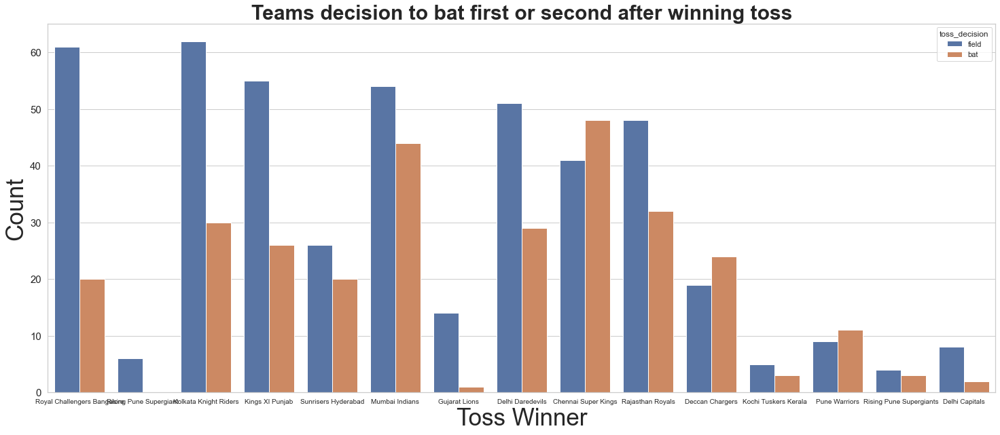

In [84]:
plt.figure(figsize = (25,10))
sns.countplot('toss_winner', data = matches, hue = 'toss_decision')
plt.title("Teams decision to bat first or second after winning toss", size = 30, fontweight = 'bold')
plt.xticks(size = 10)
plt.yticks(size = 15)
plt.xlabel("Toss Winner", size = 35)
plt.ylabel("Count", size = 35)

- Most teams field first after winning toss except for Chennai Super Kings who has mostly opted to bat first. Deccan Chargers and Pune Warriors also show the same trend.

# Does winning matches by fielding first vary across venues or it is universally true for all venues?

Text(0, 0.5, 'Venue')

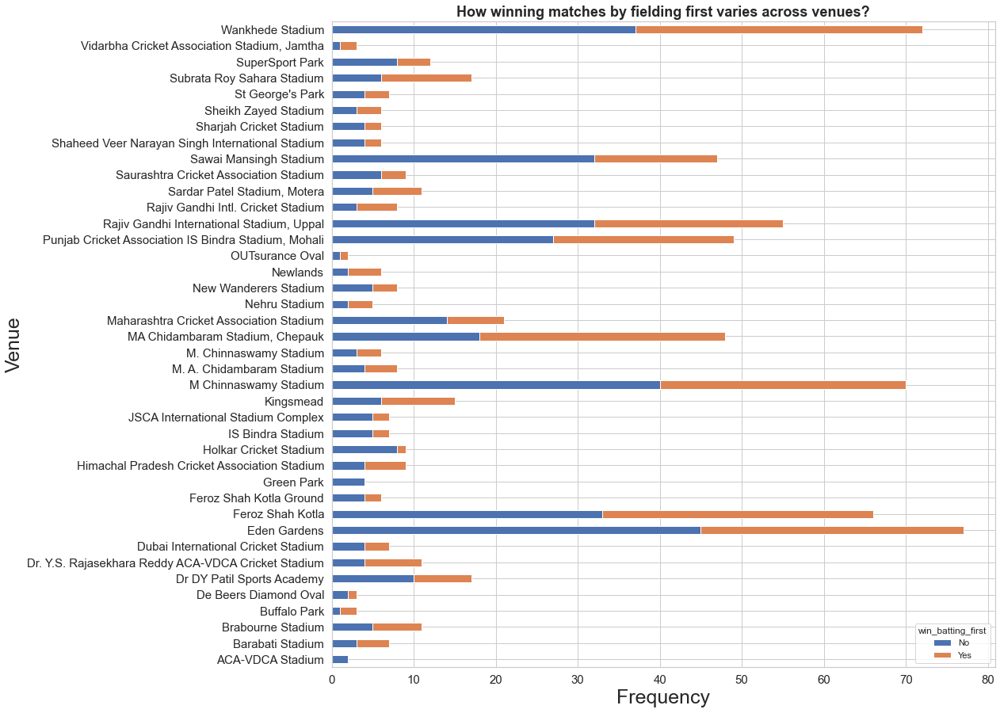

In [88]:
new_matches = matches[matches['result'] == 'normal']   #taking all those matches where result is normal and creating a new dataframe
new_matches['win_batting_first'] = np.where((new_matches.win_by_runs > 0), 'Yes', 'No')
new_matches.groupby('venue')['win_batting_first'].value_counts().unstack().plot(kind = 'barh', stacked = True,
                                                                               figsize=(15,15))
plt.title("How winning matches by fielding first varies across venues?", fontsize=18,fontweight="bold")
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.xlabel("Frequency", fontsize = 25)
plt.ylabel("Venue", fontsize = 25)

- Batting second has been more rewarding in almost all the venues

# Is batting second advantageous aross all years?

Text(0, 0.5, 'Count')

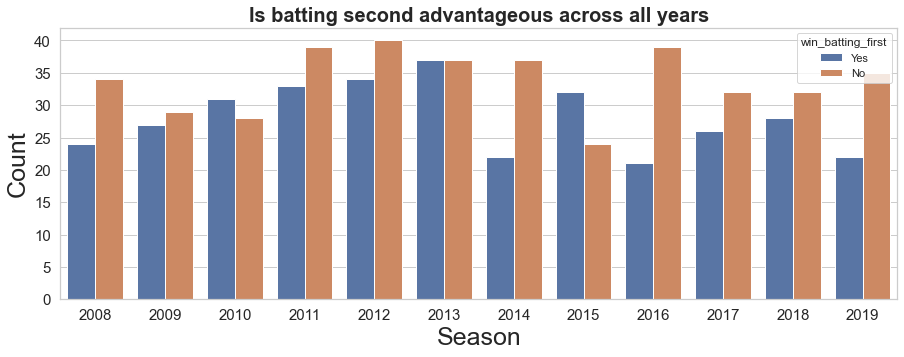

In [89]:
plt.figure(figsize = (15,5))
sns.countplot('season', data = new_matches, hue = 'win_batting_first')
plt.title("Is batting second advantageous across all years", fontsize=20,fontweight="bold")
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.xlabel("Season", fontsize = 25)
plt.ylabel("Count", fontsize = 25)

- Except for 2010 and 2015, in all other years it can be seen that teams batting second have won more matches

# Does winning by fielding first also valid for rain affected (dl) matches?

In [90]:
new_matches.groupby(['dl_applied','win_batting_first']).count()['season']

dl_applied  win_batting_first
0           No                   398
            Yes                  326
1           No                     8
            Yes                   11
Name: season, dtype: int64

Text(0, 0.5, 'Frequency')

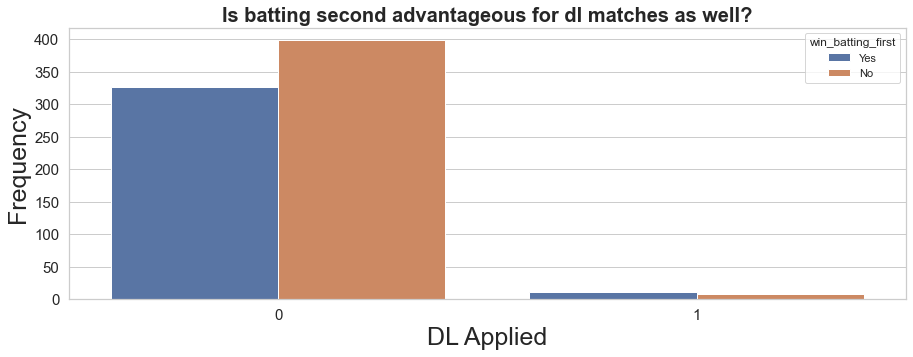

In [92]:
plt.figure(figsize = (15,5))
sns.countplot('dl_applied', data = new_matches, hue ='win_batting_first')
plt.title("Is batting second advantageous for dl matches as well?", fontsize=20,fontweight="bold")
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.xlabel("DL Applied", fontsize = 25)
plt.ylabel("Frequency", fontsize = 25)


- When dl was applied, there is hardly any difference between batting first and batting second though batting first has a slight advantage over batting second

# Which team has defended handsomely after winning toss i.e. won by big margins?

In [ ]:
#In order to answer this question we first need to plot the distribution win_by_runs column

Text(0, 0.5, 'Frequency')

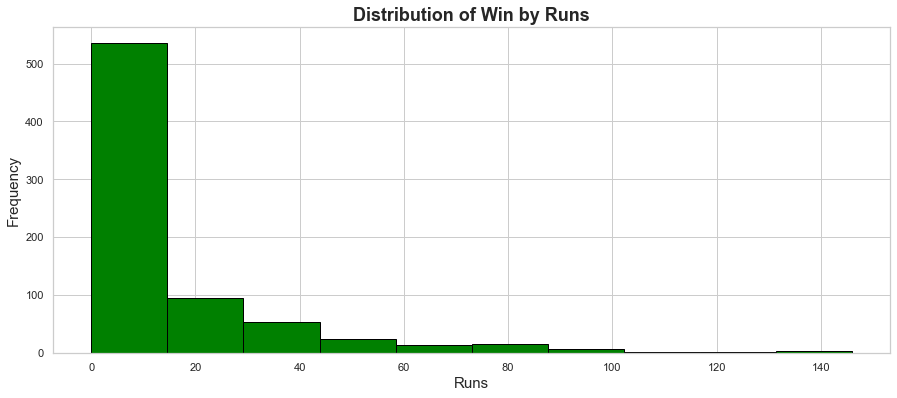

In [93]:
matches.win_by_runs.plot(kind = 'hist', edgecolor = 'black', figsize =(15,6), color = 'green') #right skewed
plt.title("Distribution of Win by Runs",fontsize= 18, fontweight = 'bold')
plt.xlabel("Runs", size = 15)
plt.ylabel("Frequency", size = 15)

#for a T20 match anything above 40 runs is quite a big win margin

(array([ 0.,  2.,  4.,  6.,  8., 10.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

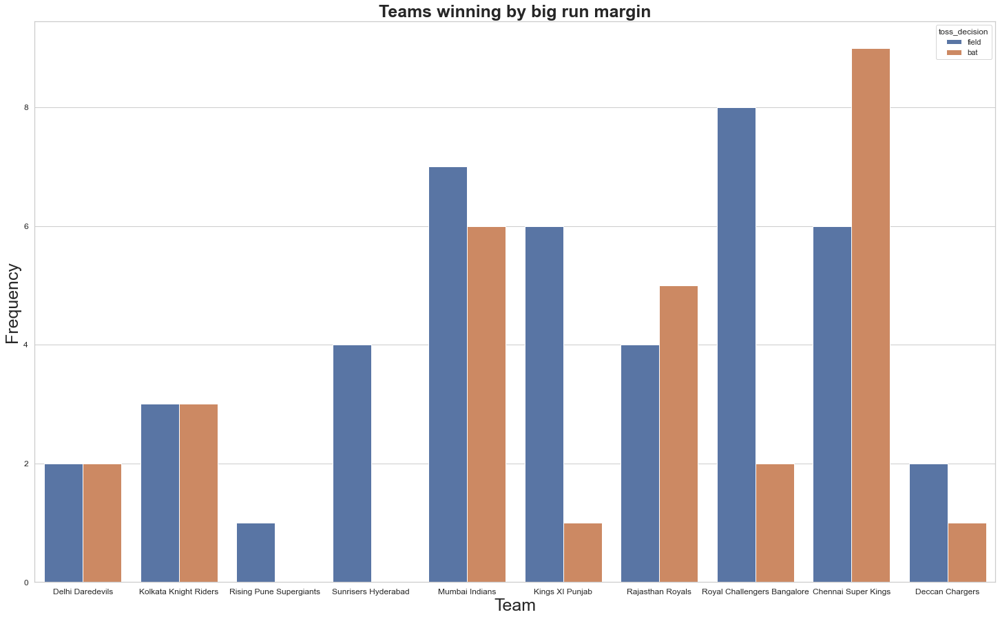

In [94]:
#Teams which have won matches by more than say 42 runs
big_run_margin = pd.DataFrame(matches[matches.win_by_runs > 42][['winner','toss_winner','toss_decision']])
plt.figure(figsize=(25,15))
sns.countplot('winner', data = big_run_margin, hue = 'toss_decision')
plt.title("Teams winning by big run margin",fontsize= 25, fontweight = 'bold')
plt.xlabel("Team", size = 25)
plt.ylabel("Frequency", size = 25)
plt.xticks(size = 12)
plt.yticks(size = 12)

- CSK has beaten opponents most number of times by big run margin. Also CSK has mostly decided to bat first after winning toss which explains their winning by runs phenomenon

# Which team has chased down totals successfully with good number of wickets left at hand?

In [ ]:
#In order to answer this question we first need to plot the distribution win_by_wickets column

Text(0, 0.5, 'Frequency')

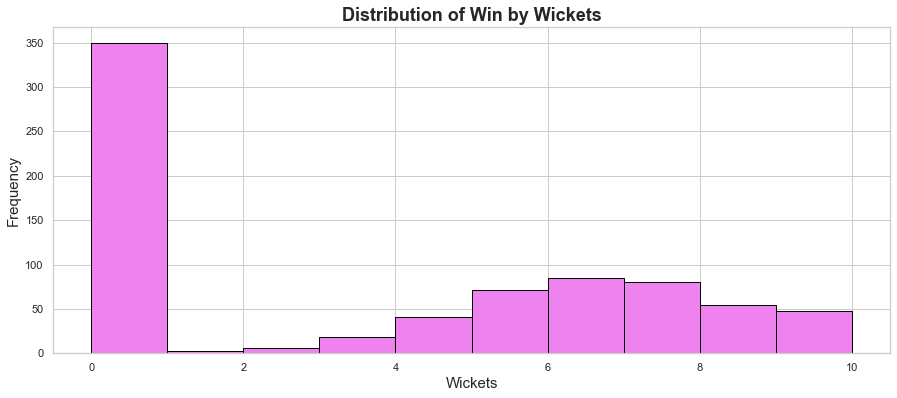

In [95]:
matches.win_by_wickets.plot(kind = 'hist', edgecolor = 'black', figsize =(15,6), color = 'violet') #right skewed
plt.title("Distribution of Win by Wickets",fontsize= 18, fontweight = 'bold')
plt.xlabel("Wickets", size = 15)
plt.ylabel("Frequency", size = 15)

#Winning with more than 5 wickets remaining is quite good in t20 matches

(array([ 0.,  5., 10., 15., 20., 25., 30.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

<Figure size 1800x720 with 0 Axes>

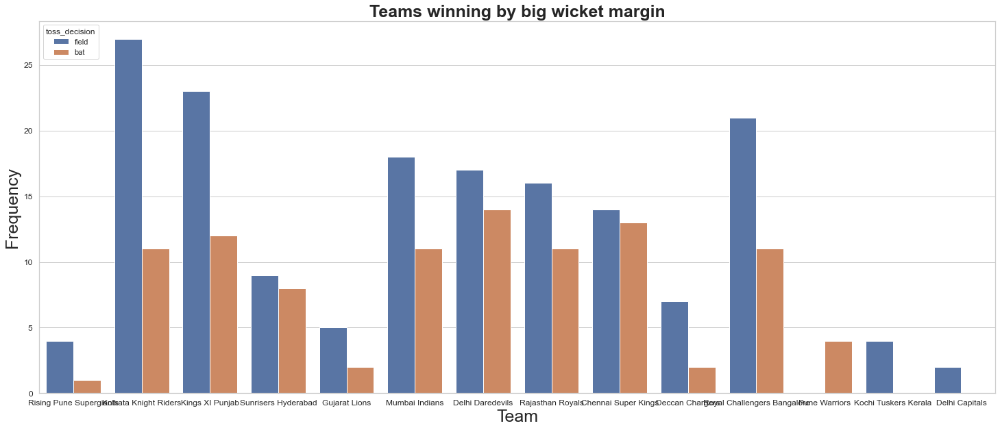

In [96]:
#Teams which have won matches by more than 5 wickets
big_wicket_margin = pd.DataFrame(matches[matches.win_by_wickets > 5][['winner','toss_winner','toss_decision']])
plt.figure(figsize=(25,10))
plt.figure(figsize=(25,10))
sns.countplot('winner', data = big_wicket_margin, hue='toss_decision')
plt.title("Teams winning by big wicket margin",fontsize= 25, fontweight = 'bold')
plt.xlabel("Team", size = 25)
plt.ylabel("Frequency", size = 25)
plt.xticks(size = 12)
plt.yticks(size = 12)

- KKR, Kings XI Punjab, Delhi Daredevils and RCB have won by good wicket margins over the years and they have all decided to field first after winning toss`

# We will now use the merged data frame to gain more insghts - this time it will be based more on individual players

# Have teams started to score more easily over the years?

(array([15000., 16000., 17000., 18000., 19000., 20000., 21000., 22000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

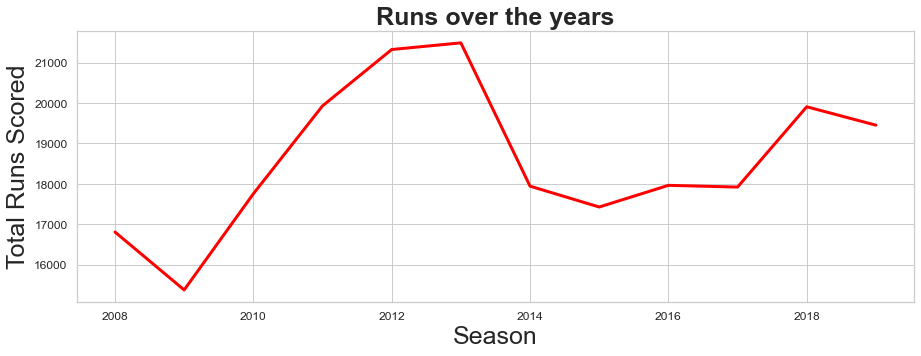

In [97]:
merge_df.groupby('season')['batsman_runs'].sum().plot(kind = 'line', linewidth = 3, figsize =(15,5),
                                                                                             color = 'red')
plt.title("Runs over the years",fontsize= 25, fontweight = 'bold')
plt.xlabel("Season", size = 25)
plt.ylabel("Total Runs Scored", size = 25)
plt.xticks(size = 12)
plt.yticks(size = 12)

- Run scoring has gone up from the start of the IPL in 2008.

# Are some venues more batsmen friendly than others?

In [ ]:
#In order to answer this question we can see the average runs scored in each venue which has hosted say minimum of 20
#matches so far in IPL

In [98]:
venue_list = list(merge_df.venue.unique())
total_runs = {}
total_matches = {}

for i in venue_list:
    total_runs[i] = merge_df[merge_df.venue == i]['batsman_runs'].sum()
    total_matches[i] = merge_df[merge_df.venue == i].nunique()['match_id']
    
average_runs = pd.DataFrame({'runs':total_runs, 'matches':total_matches})
average_runs.reset_index(inplace = True)
average_runs['average'] = average_runs['runs']/average_runs['matches']

def highlight_cols(s):
    color = 'orange'
    return 'background-color: %s' % color
average_runs[average_runs['matches'] > 20].sort_values(by = 'average', ascending = False).style.applymap(highlight_cols,
                                                        subset=pd.IndexSlice[:, ['index', 'matches','average']])

,index,runs,matches,average
1,Maharashtra Cricket Association Stadium,6556,21,312.190476
5,Wankhede Stadium,22419,73,307.109589
8,"Punjab Cricket Association IS Bindra Stadium, Mohali",14931,49,304.714286
11,"MA Chidambaram Stadium, Chepauk",14878,49,303.632653
4,M Chinnaswamy Stadium,22011,73,301.520548
7,Feroz Shah Kotla,19879,67,296.701493
6,Eden Gardens,22642,77,294.051948
0,"Rajiv Gandhi International Stadium, Uppal",16299,56,291.053571
10,Sawai Mansingh Stadium,13650,47,290.425532


- Maharashtra Cricket Association Stadium has the highest average 312.19 with 21 matches being played
- Most number of matches have been played in Chinnaswamy in Bengaluru and average is higher than 300. This suggests Chinnaswamy has been quite batsman friendly followed by Wankhede in Mumbai

# Top Run Getters of IPL.

(array([   0., 1000., 2000., 3000., 4000., 5000., 6000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

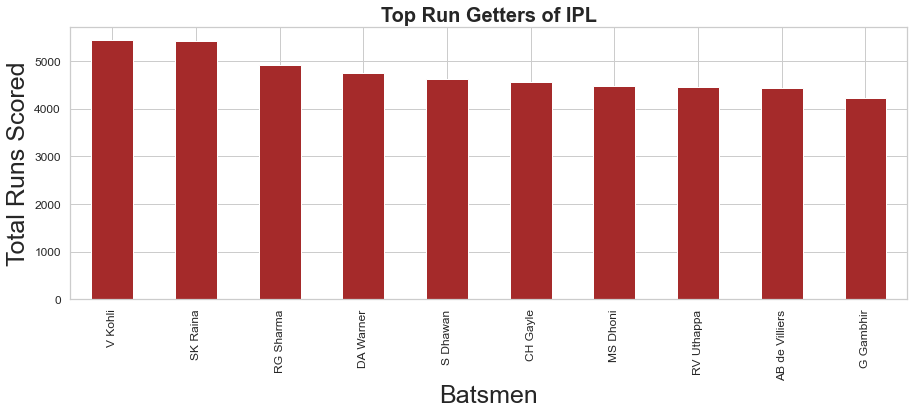

In [101]:
#let's plot the top 10 run getter so far in IPL
merge_df.groupby('batsman')['batsman_runs'].sum().sort_values(ascending = False).head(10).plot(kind = 'bar', color = 'brown',
                                                                                            figsize = (15,5))
plt.title("Top Run Getters of IPL", fontsize = 20, fontweight = 'bold')
plt.xlabel("Batsmen", size = 25)
plt.ylabel("Total Runs Scored", size = 25)
plt.xticks(size = 12)
plt.yticks(size = 12)

- Except for MS Dhoni, all other top run getters are either openers or come in 3rd or 4th positions to bat
- V Kohli is the highest run getter in IPL.

# Which batsman has been most consistent among top 10 run getters?

(array([-200.,    0.,  200.,  400.,  600.,  800., 1000., 1200.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

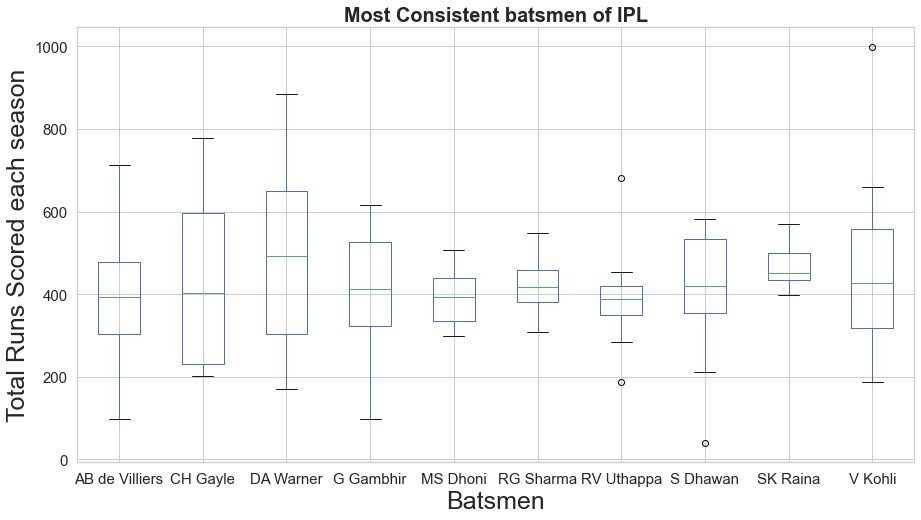

In [104]:
consistent_batsman = merge_df[merge_df.batsman.isin(['SK Raina', 'V Kohli','RG Sharma','G Gambhir',
                                            'RV Uthappa', 'S Dhawan','CH Gayle', 'MS Dhoni',
                                            'DA Warner', 'AB de Villiers'])][['batsman','season','total_runs']]

consistent_batsman.groupby(['season','batsman'])['total_runs'].sum().unstack().plot(kind = 'box', figsize = (15,8))
plt.title("Most Consistent batsmen of IPL", fontsize = 20, fontweight = 'bold')
plt.xlabel("Batsmen", size = 25)
plt.ylabel("Total Runs Scored each season", size = 25)
plt.xticks(size = 15)
plt.yticks(size = 15)

- Median score for Raina is above all the top 10 run getters. He has the highest lowest run among all the batsmen across 11 seasons. Considering the highest and lowest season totals and spread of runs, it seems Raina has been most consistent among all.

# Which bowlers have performed the best?

(array([  0.,  25.,  50.,  75., 100., 125., 150., 175., 200.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

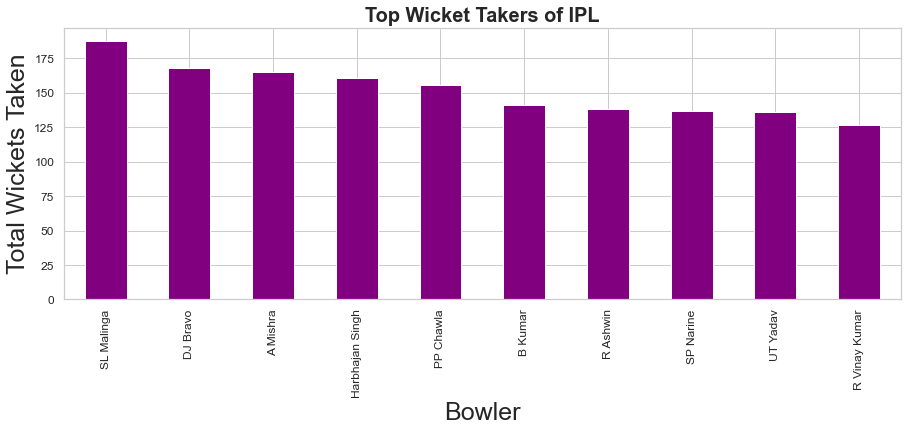

In [106]:

merge_df.groupby('bowler')['player_dismissed'].count().sort_values(ascending = False).head(10).plot(kind = 'bar', 
                                                color = 'purple', figsize = (15,5))
plt.title("Top Wicket Takers of IPL", fontsize = 20, fontweight = 'bold')
plt.xlabel("Bowler", size = 25)
plt.ylabel("Total Wickets Taken", size = 25)
plt.xticks(size = 12)
plt.yticks(size = 12)

- Malinga has taken the most number of wickets in IPL followed by Bravo and Amit Mishra
- In top 10 bowlers, 5 are fast and medium pacers while the other 5 are spinners
- All 5 spinners are right arm spinners and 2 are leg spinners while 3 are off spinners
- All 5 pacers are right arm pacers

# Batsmen with the best strike rates over the years .

In [108]:
#We will consider players who have played 10 or more seasons
no_of_balls = pd.DataFrame(merge_df.groupby('batsman')['ball'].count()) #total number of matches played by each batsman
runs = pd.DataFrame(merge_df.groupby('batsman')['batsman_runs'].sum()) #total runs of each batsman
seasons = pd.DataFrame(merge_df.groupby('batsman')['season'].nunique()) #season = 1 implies played only 1 season

batsman_strike_rate = pd.DataFrame({'balls':no_of_balls['ball'],'run':runs['batsman_runs'],'season':seasons['season']})
batsman_strike_rate.reset_index(inplace = True)

batsman_strike_rate['strike_rate'] = batsman_strike_rate['run']/batsman_strike_rate['balls']*100
highest_strike_rate = batsman_strike_rate[batsman_strike_rate.season.isin([10,11])][['season','batsman','strike_rate']].sort_values(by = 'strike_rate',
                                                                                                            ascending = False)

highest_strike_rate.head(10)

,season,batsman,strike_rate
92,11,CH Gayle,145.640370
213,10,KA Pollard,141.751527
112,10,DA Warner,139.523249
444,11,SR Watson,136.945813
72,11,BB McCullum,127.332746
449,10,STR Binny,126.000000
118,11,DJ Bravo,125.565801
514,11,Yuvraj Singh,125.283190
53,10,AT Rayudu,124.058187
147,11,G Gambhir,119.835414


(array([  0.,  20.,  40.,  60.,  80., 100., 120., 140., 160.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

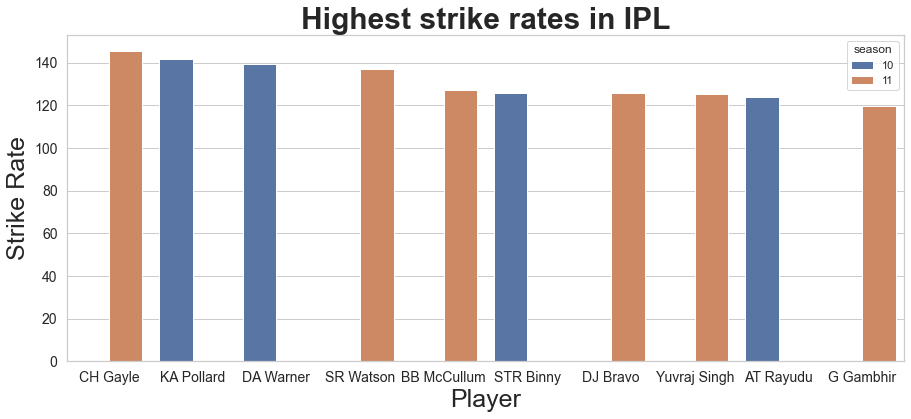

In [109]:
plt.figure(figsize = (15,6))
sns.barplot(x='batsman', y='strike_rate', data = highest_strike_rate.head(10), hue = 'season')
plt.title("Highest strike rates in IPL",fontsize= 30, fontweight = 'bold')
plt.xlabel("Player", size = 25)
plt.ylabel("Strike Rate", size = 25)
plt.xticks(size = 14)
plt.yticks(size = 14)

-  Gayle have the highest strike rates in IPL. They are the big hitters and can win any match on their day

# Runs scored by all the teams across seasons

(array([    0.,  5000., 10000., 15000., 20000., 25000., 30000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

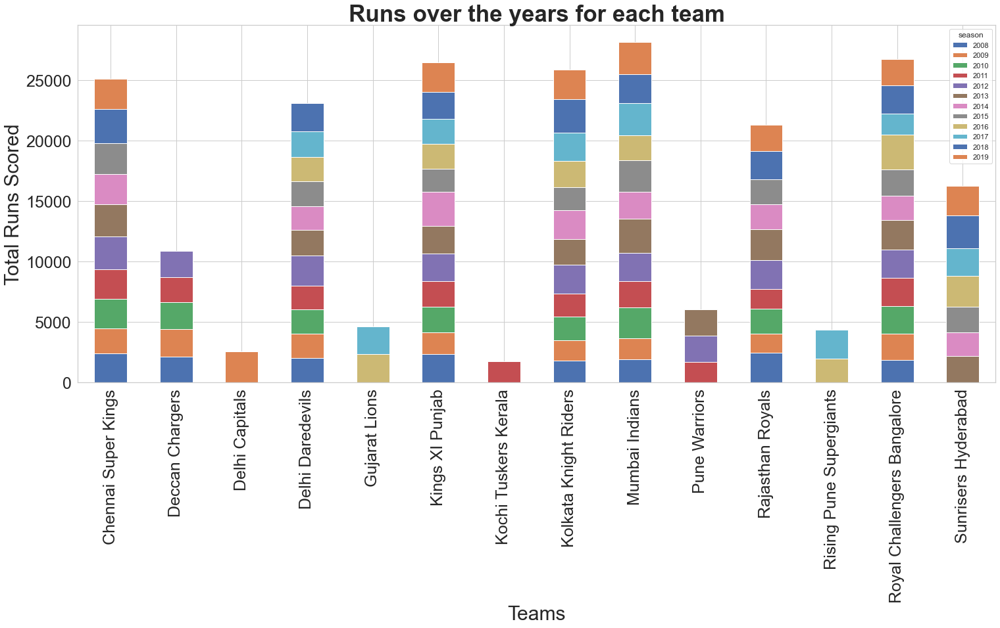

In [110]:
merge_df.groupby(['batting_team','season'])['batsman_runs'].sum().unstack().plot(kind = 'bar',stacked = True ,
                                                                                figsize = (25,10))
plt.title("Runs over the years for each team",fontsize= 35, fontweight = 'bold')
plt.xlabel("Teams", size = 30)
plt.ylabel("Total Runs Scored", size = 30)
plt.xticks(size = 25)
plt.yticks(size = 25)

- Over the years run scoring has gone up for all teams. For CSK, every year has seen more runs than preceeding year.

# Which bowlers have performed well over last few seasons and can be considered further for upcoming auctions?

In [ ]:
#We will consider the bowling average here for bowlers who have taken at least 50 wickets

In [111]:
runs_given = pd.DataFrame(merge_df.groupby('bowler')['batsman_runs'].sum())
wickets_taken = pd.DataFrame(merge_df[merge_df['dismissal_kind'] != 'no dismissal'].groupby('bowler')['dismissal_kind'].count())
seasons_played = pd.DataFrame(merge_df.groupby('bowler')['season'].nunique())
bowler_avg = pd.DataFrame({'runs':runs_given['batsman_runs'],'wickets':wickets_taken['dismissal_kind'],
                          'season':seasons_played['season']})
bowler_avg.reset_index(inplace = True)

bowler_avg['wickets'].dropna(axis = 0, inplace = True)

In [112]:
bowler_avg['bowling_average'] = bowler_avg['runs']/bowler_avg['wickets']
best_bowling_avg = bowler_avg[bowler_avg['wickets'] > 50].sort_values(by = 'bowling_average', ascending = True).head(10)

(array([ 0.,  5., 10., 15., 20., 25.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

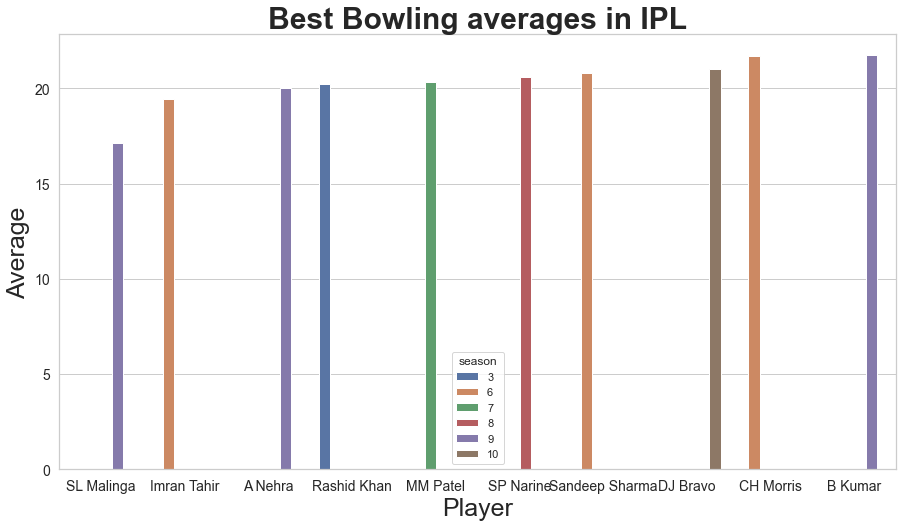

In [113]:
plt.figure(figsize = (15,8))
sns.barplot(x='bowler', y='bowling_average', data = best_bowling_avg, hue = 'season')
plt.title("Best Bowling averages in IPL",fontsize= 30, fontweight = 'bold')
plt.xlabel("Player", size = 25)
plt.ylabel("Average", size = 25)
plt.xticks(size = 14)
plt.yticks(size = 14)

- Malinga has taken the most wickets at the best avg of 16.27.

# Bowlers with maximum number of extras.

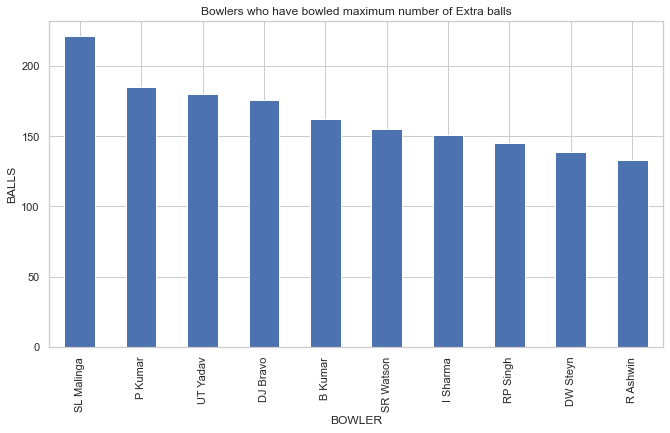

,SL Malinga,P Kumar,UT Yadav,DJ Bravo,B Kumar,SR Watson,I Sharma,RP Singh,DW Steyn,R Ashwin
bowler,221,185,180,176,162,155,151,145,139,133


In [114]:
extra = deliveries[deliveries['extra_runs']!=0]['bowler'].value_counts()[:10]
extra.plot(kind='bar', figsize=(11,6), title='Bowlers who have bowled maximum number of Extra balls')

plt.xlabel('BOWLER')
plt.ylabel('BALLS')
plt.show()

extra = pd.DataFrame(extra)
extra.T

#  Which bowlers have picked up wickets more frequently?

In [116]:
#strike_rate = balls bowled by wickets taken
balls_bowled = pd.DataFrame(merge_df.groupby('bowler')['ball'].count())
wickets_taken = pd.DataFrame(merge_df[merge_df['dismissal_kind'] != 'no dismissal'].groupby('bowler')['dismissal_kind'].count())
seasons_played = pd.DataFrame(merge_df.groupby('bowler')['season'].nunique())
bowler_strike_rate = pd.DataFrame({'balls':balls_bowled['ball'],'wickets':wickets_taken['dismissal_kind'],
                          'season':seasons_played['season']})
bowler_strike_rate.reset_index(inplace = True)

In [117]:
bowler_strike_rate['strike_rate'] = bowler_strike_rate['balls']/bowler_strike_rate['wickets']
def highlight_cols(s):
    color = 'skyblue'
    return 'background-color: %s' % color
#Strike rate for bowlers who have taken more than 50 wickets
best_bowling_strike_rate = bowler_strike_rate[bowler_strike_rate['wickets'] > 50].sort_values(by = 'strike_rate', ascending = True)
best_bowling_strike_rate.head().style.applymap(highlight_cols, subset=pd.IndexSlice[:, ['bowler', 'wickets','strike_rate']])

,bowler,balls,wickets,season,strike_rate
134,Imran Tahir,1249,82,6,15.231707
340,SL Malinga,2974,188,9,15.819149
93,DJ Bravo,2711,168,10,16.136905
9,A Nehra,1974,121,9,16.314050
225,MM Patel,1382,82,7,16.853659


- Imran Tahir, Bravo, Malinga have very impressive strike rates. However, both Bravo and Malinga have played 8-9 seasons of IPL and managed to maintain such good strike rates.
- Tahir has been sensational in terms of bowling average and strike rates among spinners in last 5 years
- Tahir is the only spinner in top 10

# Season wise Winners

In [118]:
final_winner = matches.drop_duplicates(subset = ['season'], keep = 'last')
final_winner[['season', 'winner']].reset_index(drop = True).sort_values('season')

,season,winner
1,2008,Rajasthan Royals
2,2009,Deccan Chargers
3,2010,Chennai Super Kings
4,2011,Chennai Super Kings
5,2012,Kolkata Knight Riders
6,2013,Mumbai Indians
7,2014,Kolkata Knight Riders
8,2015,Mumbai Indians
9,2016,Sunrisers Hyderabad
0,2017,Mumbai Indians


# Top Players

Text(0.5, 1.0, 'Top Players in the IPL')

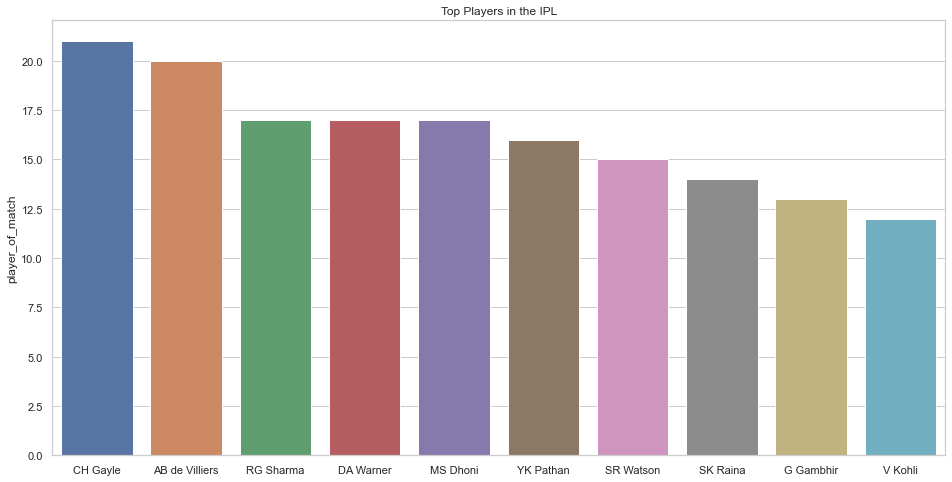

In [119]:
plt.figure(figsize = (16,8))
x = matches.player_of_match.value_counts()[:10].index
y = matches.player_of_match.value_counts()[:10]
sns.barplot(x, y).set_title('Top Players in the IPL')

# City wise Winning

In [120]:
final_winner.groupby(['city','winner']).size()

city          winner               
Bengaluru     Kolkata Knight Riders    1
              Sunrisers Hyderabad      1
Chennai       Chennai Super Kings      1
              Kolkata Knight Riders    1
Hyderabad     Mumbai Indians           2
Johannesburg  Deccan Chargers          1
Kolkata       Mumbai Indians           2
Mumbai        Chennai Super Kings      2
              Rajasthan Royals         1
dtype: int64

# Which bowlers have maintained best economy rates over the years?

In [123]:
runs_given = pd.DataFrame(merge_df.groupby('bowler')['batsman_runs'].sum())
balls_bowled = pd.DataFrame(merge_df.groupby('bowler')['ball'].count())
overs_bowled = balls_bowled['ball']/6
wickets_taken = pd.DataFrame(merge_df[merge_df['dismissal_kind'] != 'no dismissal'].groupby('bowler')['dismissal_kind'].count())
seasons_played = pd.DataFrame(merge_df.groupby('bowler')['season'].nunique())
bowler_economy_rate = pd.DataFrame({'runs':runs_given['batsman_runs'],'balls':balls_bowled['ball'],'wickets':wickets_taken['dismissal_kind'],
                          'season':seasons_played['season'],'overs':overs_bowled})
bowler_economy_rate.reset_index(inplace = True)

In [124]:
#Best economy rates for bowlers who have played at least 5 seasons
bowler_economy_rate['economy_rate'] = bowler_economy_rate['runs']/bowler_economy_rate['overs']
best_economy_rate = bowler_economy_rate[bowler_economy_rate.season >= 5].sort_values(by = 'economy_rate', ascending = True)

In [125]:
best_economy_rate.head().style.apply(lambda x: ['background: lightgreen' if x.name in [106,315,253] 
                              else '' for i in x], 
                   axis=1)

,bowler,runs,balls,wickets,season,overs,economy_rate
108,DW Steyn,2283,2207,104,10,367.833333,6.206615
207,M Muralitharan,1642,1581,67,7,263.500000,6.231499
291,RN ten Doeschate,88,83,3,5,13.833333,6.361446
286,RE van der Merwe,486,455,25,5,75.833333,6.408791
269,R Ashwin,3224,3016,138,10,502.666667,6.413793


- Steyn has the best economy rate in IPL followed by Malinga
- Among spinners who are still active, Ashwin has the best economy of 6.413

# Q1. As a sports analysts, The most successful teams, players & factors contributing win or loss of a team:
- Mumbai Indians is the most successful team in IPL and has won the most number of toss.
- There were more matches won by chasing the total(419 matches) than defending(350 matches).
- When defending a total, the biggest victory was by 146 runs(Mumbai Indians defeated Delhi Daredevils by 146 runs on 06 May 2017 at Feroz Shah Kotla stadium, Delhi).
- When chasing a target, the biggest victory was by 10 wickets(without losing any wickets) and there were 11 such instances.
- The Mumbai city has hosted the most number of IPL matches.
- Chris Gayle has won the maximum number of player of the match title.
- Eden Gardens has hosted the maximum number of IPL matches.
- If a team wins a toss choose to field first as it has highest probablity of winning

# Q2. Teams or Players a company should endorse for its products.
- If the franchise is looking for a consistant batsman who needs to score good amount of runs then go for V Kohli, S Raina, Rohit Sharma , David Warner...
- If the franchise is looking for a game changing batsman then go for Chris Gayle, AB deVillers, R Sharma , MS Dhoni...
- If the franchise is looking for a batsman who could score good amount of runs every match the go for DA Warner, CH Gayle, V Kohli,AB de Villiers,S Dhawan
- If the franchise needs the best finisher in lower order having good strike rate then go for CH Gayle,KA Pollard, DA Warner,SR Watson,BB McCullum
- If the franchise need a experienced bowler then go for Harbhajan Singh ,A Mishra,PP Chawla ,R Ashwin,SL Malinga,DJ Bravo
- If the franchise need a wicket taking bowler then go for SL Malinga,DJ Bravo,A Mishra ,Harbhajan Singh, PP Chawla
- If the franchise need a bowler bowling most number of dot balls then go for Harbhajan Singh,SL Malinga,B Kumar,A Mishra,PP Chawla
- If the franchise need a bowler with good economy then go for DW Steyn ,M Muralitharan ,R Ashwin,SP Narine ,Harbhajan Singh